# Exploration of domain parameter limits for individual equations
## Anticipation of super-resolution, and other ml output sets
* 8-bit and 16-bit of same image S.T. psnr is high
* pairs of grayscale for super resolution (2 ways)
    * higher resolution by pixel size
    * higher resolution by pixel depth & pixel size
* edge mapping for both
    
## Generate and display:

In [1]:
import warnings
warnings.filterwarnings('ignore')

import time
import sys
import tempfile

import skimage.io as im_io

from PIL import TiffImagePlugin as tip
from PIL.TiffImagePlugin import Image

import matplotlib.pyplot as pyplot

sys.path.insert(0, '../src/')
sys.path.insert(0, 'scalygraphic/src/')

from im_scale_products import *
from impute_color import *

def get_test_domain_dict(it_max=None, scale_dist=None):
    """ Usage: 
    domain_dict = get_center_domain_dict(it_max, scale_dist)
    """
    if it_max is None:
        it_max = 64
        
    if scale_dist is None:
        scale_dist = 12
        
    domain_dict = get_default_domain_dict()
    domain_dict['it_max'] = it_max
    domain_dict['max_d'] = scale_dist / domain_dict['zoom']
    domain_dict['n_rows'] = 255
    domain_dict['n_cols'] = 255
    
    return domain_dict

def get_results_gray_set(list_tuple, domain_dict):
    """ Usage: new_im = get_results_gray_set(list_tuple, domain_dict)
    
    """
    ET, Z, Z0 = eq_iter.get_primitives(list_tuple, domain_dict)
    Zd_n2, Zr_n2, ETn_n2 = etg_norm(Z0, Z, ET)

    g_im_et = primitive_2_gray(ETn_n2)
    # complex result vectors: distance component
    g_im_Zd = primitive_2_gray(Zd_n2)

    # complex result vectors: rotation component
    g_im_Zr = primitive_2_gray(Zr_n2)

    im_gray = get_gray_im(ET, Z, Z0)

    im_list = [g_im_et, g_im_Zd, g_im_Zr, im_gray]
    new_im = cat_im_list_hori(im_list)
    
    return new_im
    
def display_calc_result(list_tuple, domain_dict):
    """ Usage: (None) display_calc_result(list_tuple, domain_dict)
    
    """
    t0 = time.time()
    new_im = get_results_gray_set(list_tuple, domain_dict)
    tt = time.time() - t0
    print('domain & run constraints:')
    for k, v in domain_dict.items():
        print('%30s: %s'%(k,v))
    print('\n')
    print('%20s: %0.6f seconds\n%20s:'%(fcn_name, tt, 'parameters'), p)
    print('\n%15s%30s%30s%30s'%('ET','Zd','Zr', 'All'))
    display(new_im)

print('\t\t\tDomain dictionary for test:')
domain_dict = get_test_domain_dict()
for k, v in domain_dict.items():
    print(k,v)
    
print('\n\tEnumeration of available functions: tuples of (Name, function_handle)\n')
for k, v in name_functionhandle_dict.items():
    print('%3i %25s'%(k, v[0]), v[1])

			Domain dictionary for test:
center_point 0j
zoom 0.5
theta 0.0
it_max 64
max_d 24.0
n_rows 255
n_cols 255

	Enumeration of available functions: tuples of (Name, function_handle)

  0                    ElGato <function ElGato at 0x7fc54088bea0>
  1                  IslaLace <function IslaLace at 0x7fc54088bc80>
  2              ItchicuPpwrF <function ItchicuPpwrF at 0x7fc54088bd90>
  3                  Nautuliz <function Nautuliz at 0x7fc54088b9d8>
  4                    RoyalZ <function RoyalZ at 0x7fc54088bd08>
  5                bugga_bear <function bugga_bear at 0x7fc54088b7b8>
  6                de_Okeeffe <function de_Okeeffe at 0x7fc54088bbf8>
  7                 decPwrAFx <function decPwrAFx at 0x7fc54088bae8>
  8                dreadSkull <function dreadSkull at 0x7fc54088bb70>
  9                      nlC3 <function nlC3 at 0x7fc54088ba60>
 10                      plC6 <function plC6 at 0x7fc54088be18>
 11                     snflk <function snflk at 0x7fc540891048>
 12   

domain & run constraints:
                  center_point: 0j
                          zoom: 5
                         theta: 0.0
                        it_max: 64
                         max_d: 2.4
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpv_2dcd3d


     starfish_ish_II: 1.205810 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


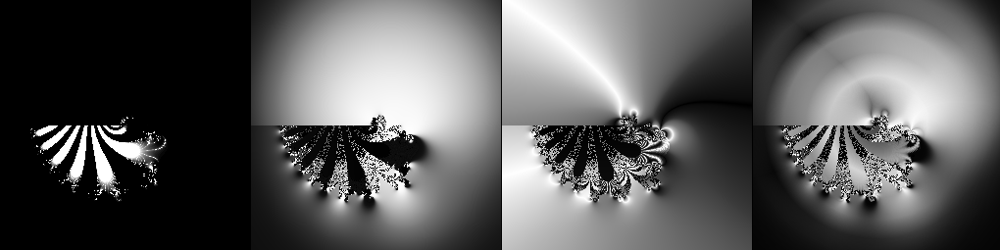

domain & run constraints:
                  center_point: 0j
                          zoom: 4
                         theta: 0.0
                        it_max: 64
                         max_d: 3.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmph6afavi5


     starfish_ish_II: 1.002083 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


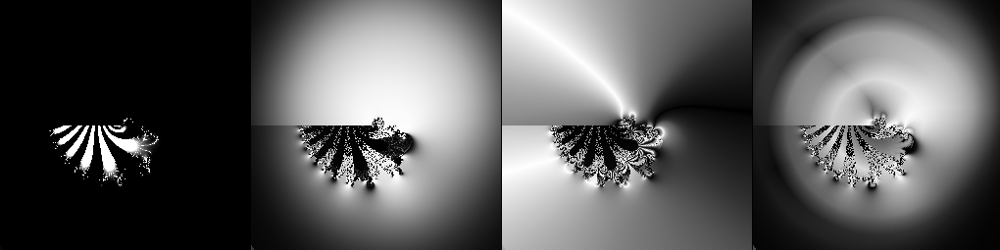

domain & run constraints:
                  center_point: 0j
                          zoom: 3
                         theta: 0.0
                        it_max: 64
                         max_d: 4.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmps2ttmk6g


     starfish_ish_II: 1.186965 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


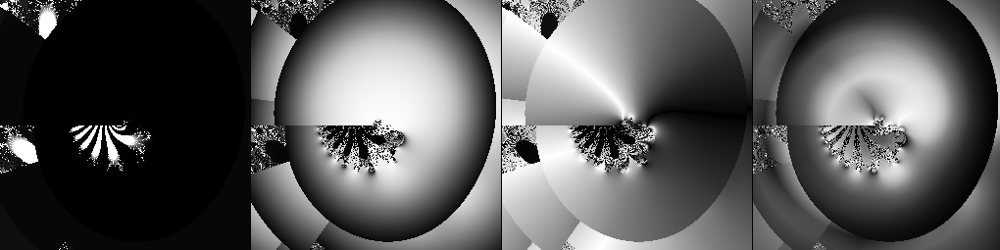

domain & run constraints:
                  center_point: 0j
                          zoom: 2
                         theta: 0.0
                        it_max: 64
                         max_d: 6.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpalymjjm8


     starfish_ish_II: 2.846833 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


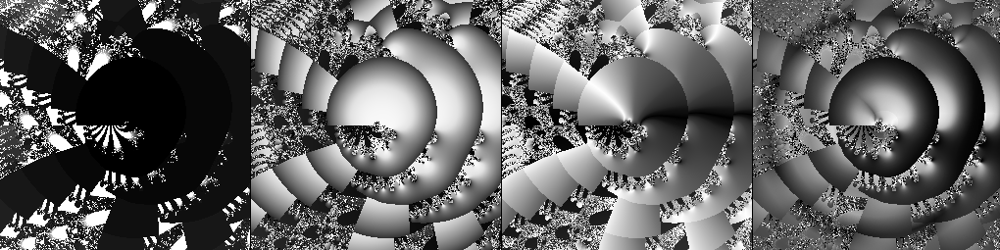

domain & run constraints:
                  center_point: 0j
                          zoom: 1
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp0asvzhel


     starfish_ish_II: 7.985653 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


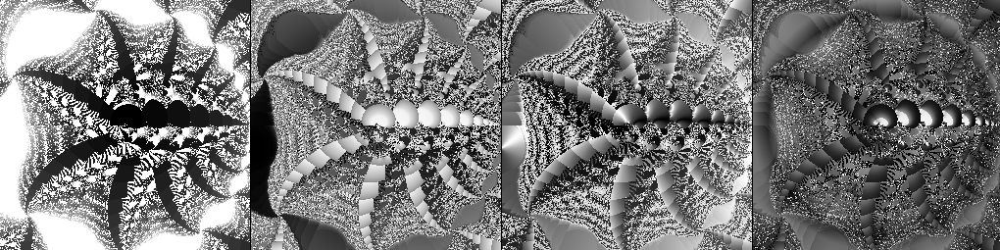

domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp5lma8cav


     starfish_ish_II: 8.361924 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


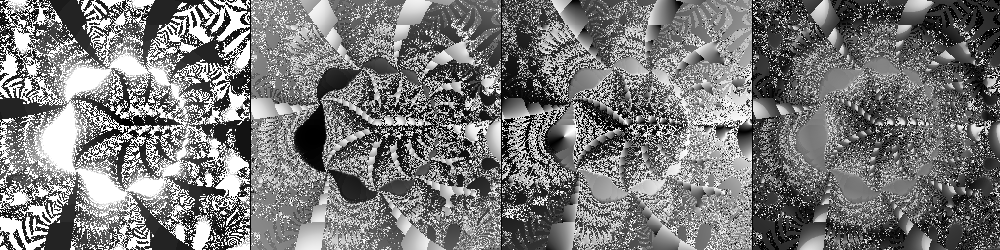

domain & run constraints:
                  center_point: 0j
                          zoom: 0.14285714285714285
                         theta: 0.0
                        it_max: 64
                         max_d: 84.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp6iun23ns


     starfish_ish_II: 8.136557 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


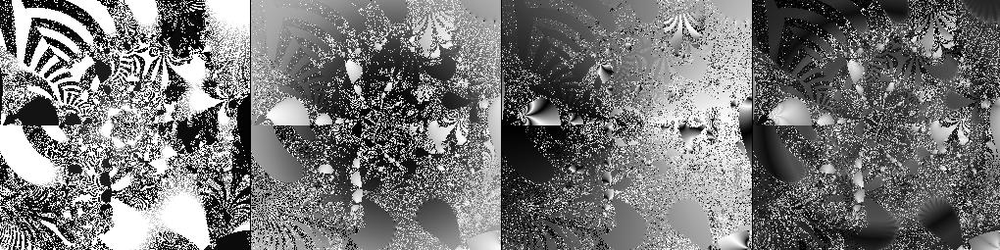

domain & run constraints:
                  center_point: 0j
                          zoom: 0.08333333333333333
                         theta: 0.0
                        it_max: 64
                         max_d: 144.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpwynf06zf


     starfish_ish_II: 8.343285 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


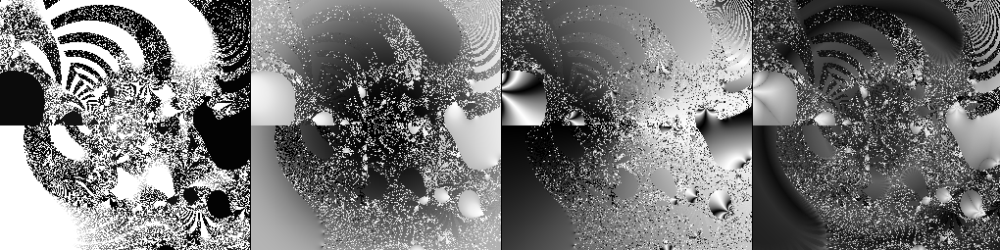

domain & run constraints:
                  center_point: 0j
                          zoom: 0.058823529411764705
                         theta: 0.0
                        it_max: 64
                         max_d: 204.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp_r4jhef3


     starfish_ish_II: 7.854616 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


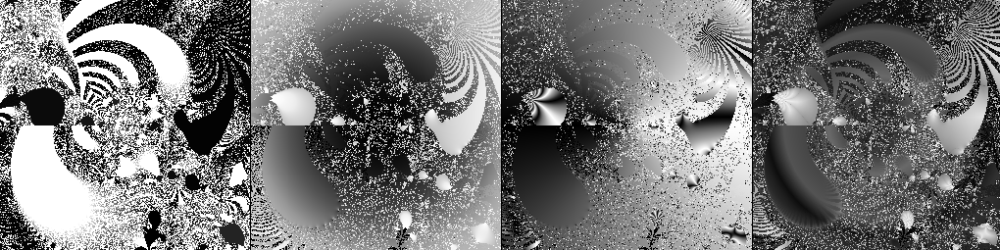

domain & run constraints:
                  center_point: 0j
                          zoom: 0.045454545454545456
                         theta: 0.0
                        it_max: 64
                         max_d: 264.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpbwp06k0e


     starfish_ish_II: 7.565417 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


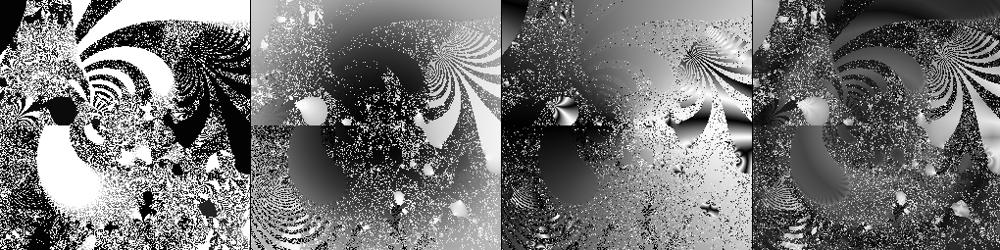

domain & run constraints:
                  center_point: 0j
                          zoom: 0.037037037037037035
                         theta: 0.0
                        it_max: 64
                         max_d: 324.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmps1zyr651


     starfish_ish_II: 7.401633 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


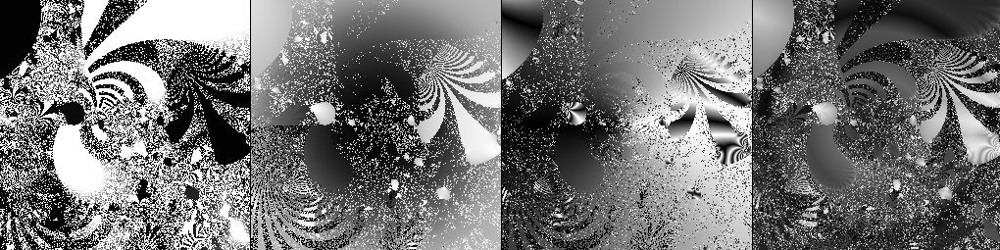

domain & run constraints:
                  center_point: 0j
                          zoom: 0.03125
                         theta: 0.0
                        it_max: 64
                         max_d: 384.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpjo6oqd5j


     starfish_ish_II: 7.591598 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


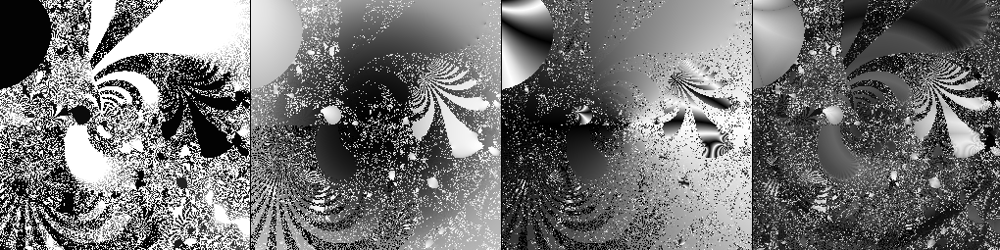

domain & run constraints:
                  center_point: 0j
                          zoom: 0.02702702702702703
                         theta: 0.0
                        it_max: 64
                         max_d: 444.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpp8zi3cm8


     starfish_ish_II: 8.057719 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


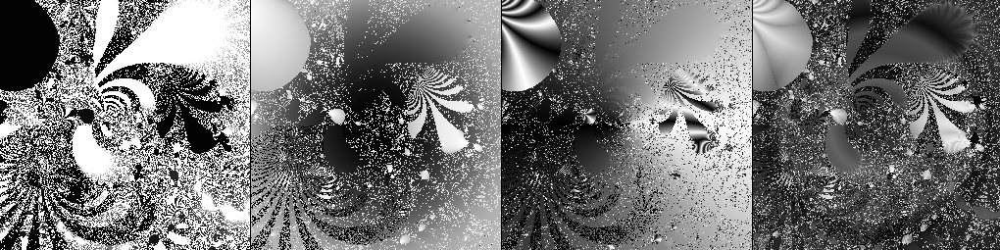

domain & run constraints:
                  center_point: 0j
                          zoom: 0.023809523809523808
                         theta: 0.0
                        it_max: 64
                         max_d: 504.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpjmazpoh7


     starfish_ish_II: 8.164551 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


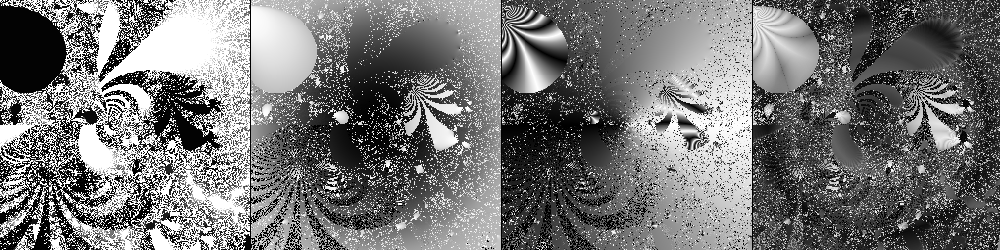

domain & run constraints:
                  center_point: 0j
                          zoom: 0.02127659574468085
                         theta: 0.0
                        it_max: 64
                         max_d: 564.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpvaonw1ad


     starfish_ish_II: 8.167635 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


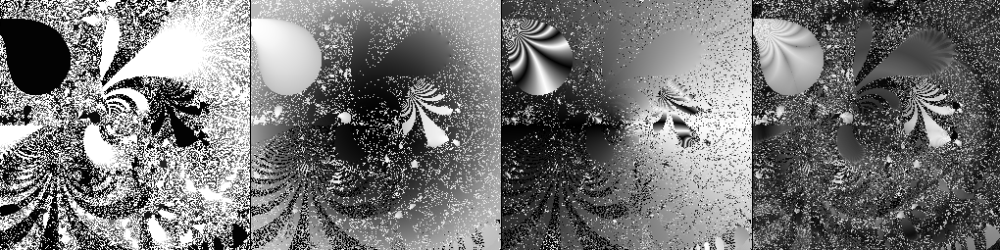

domain & run constraints:
                  center_point: 0j
                          zoom: 0.019230769230769232
                         theta: 0.0
                        it_max: 64
                         max_d: 624.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpjdz9e0vx


     starfish_ish_II: 7.934232 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


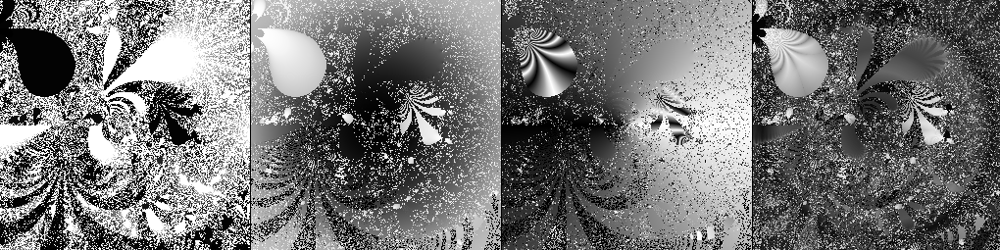

domain & run constraints:
                  center_point: 0j
                          zoom: 0.017543859649122806
                         theta: 0.0
                        it_max: 64
                         max_d: 684.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp6eanvok3


     starfish_ish_II: 8.084671 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


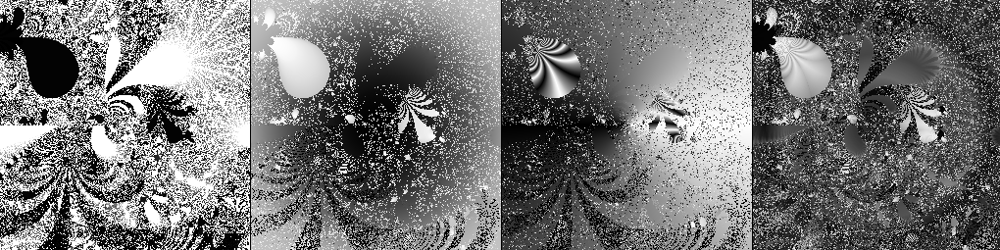

domain & run constraints:
                  center_point: 0j
                          zoom: 0.016129032258064516
                         theta: 0.0
                        it_max: 64
                         max_d: 744.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp10iunofr


     starfish_ish_II: 8.117080 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


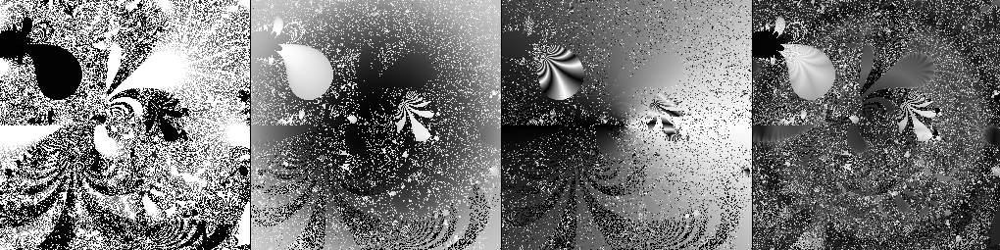

domain & run constraints:
                  center_point: 0j
                          zoom: 0.014925373134328358
                         theta: 0.0
                        it_max: 64
                         max_d: 804.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpsf49i11o


     starfish_ish_II: 8.241415 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


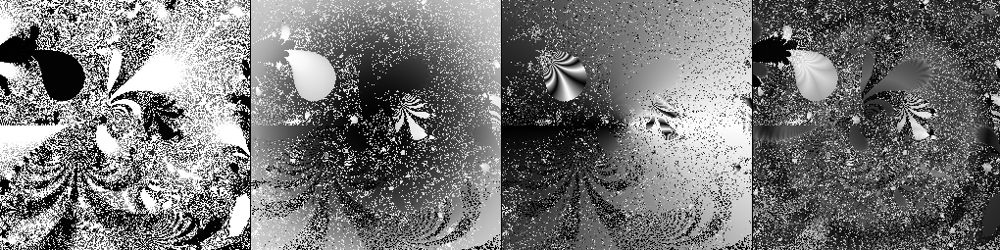

domain & run constraints:
                  center_point: 0j
                          zoom: 0.013888888888888888
                         theta: 0.0
                        it_max: 64
                         max_d: 864.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp7ho2ykyn


     starfish_ish_II: 8.286801 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


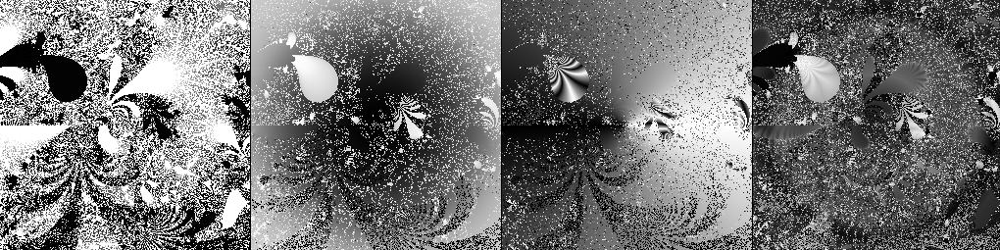

domain & run constraints:
                  center_point: 0j
                          zoom: 0.012987012987012988
                         theta: 0.0
                        it_max: 64
                         max_d: 923.9999999999999
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpsit7w1c3


     starfish_ish_II: 8.310280 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


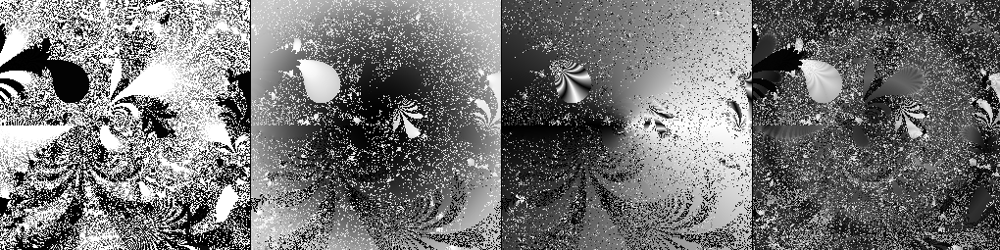

domain & run constraints:
                  center_point: 0j
                          zoom: 0.012195121951219513
                         theta: 0.0
                        it_max: 64
                         max_d: 984.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpxls42615


     starfish_ish_II: 8.206239 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


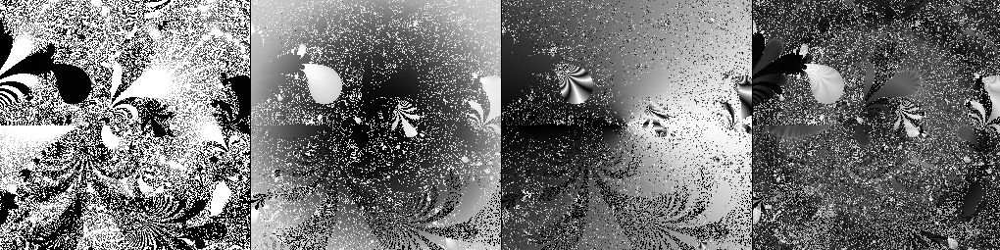

domain & run constraints:
                  center_point: 0j
                          zoom: 0.011494252873563218
                         theta: 0.0
                        it_max: 64
                         max_d: 1044.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp67bfurk6


     starfish_ish_II: 8.114918 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


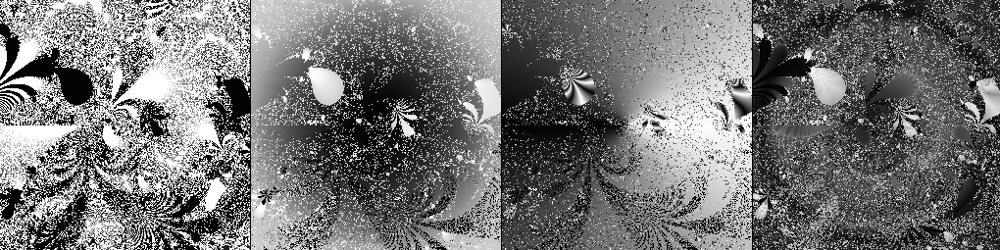

domain & run constraints:
                  center_point: 0j
                          zoom: 0.010869565217391304
                         theta: 0.0
                        it_max: 64
                         max_d: 1104.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpinmsx29o


     starfish_ish_II: 8.204022 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


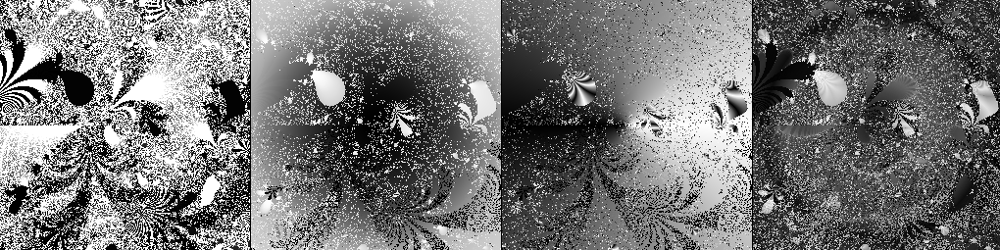

domain & run constraints:
                  center_point: 0j
                          zoom: 0.010309278350515464
                         theta: 0.0
                        it_max: 64
                         max_d: 1164.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp4ms10vx1


     starfish_ish_II: 8.082446 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


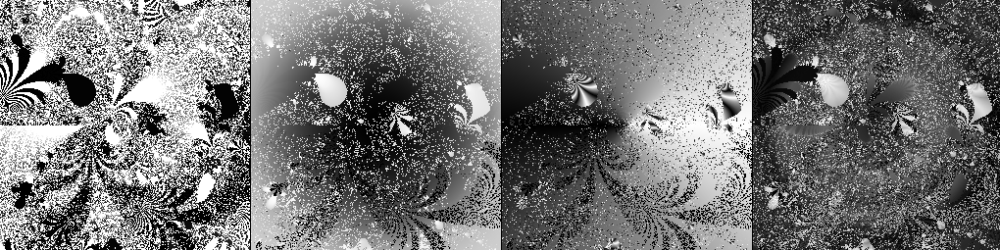

domain & run constraints:
                  center_point: 0j
                          zoom: 0.00980392156862745
                         theta: 0.0
                        it_max: 64
                         max_d: 1224.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpxzx93ohf


     starfish_ish_II: 8.098279 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


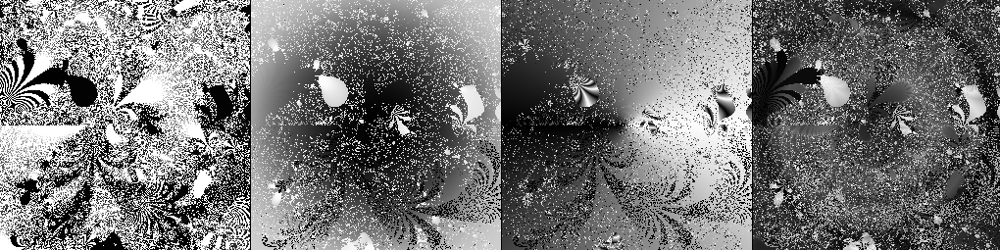

domain & run constraints:
                  center_point: 0j
                          zoom: 0.009345794392523364
                         theta: 0.0
                        it_max: 64
                         max_d: 1284.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpob3byvet


     starfish_ish_II: 8.113992 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


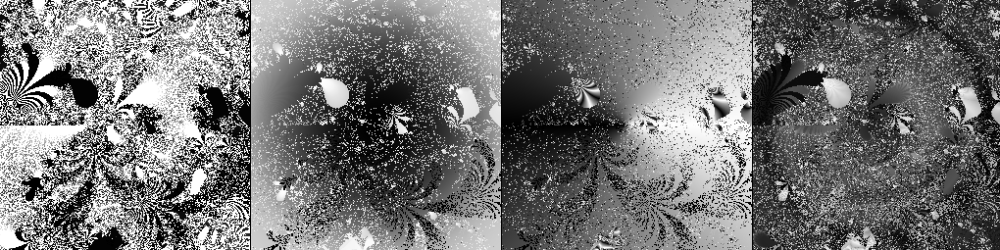

domain & run constraints:
                  center_point: 0j
                          zoom: 0.008928571428571428
                         theta: 0.0
                        it_max: 64
                         max_d: 1344.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp_lvgturn


     starfish_ish_II: 8.188180 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


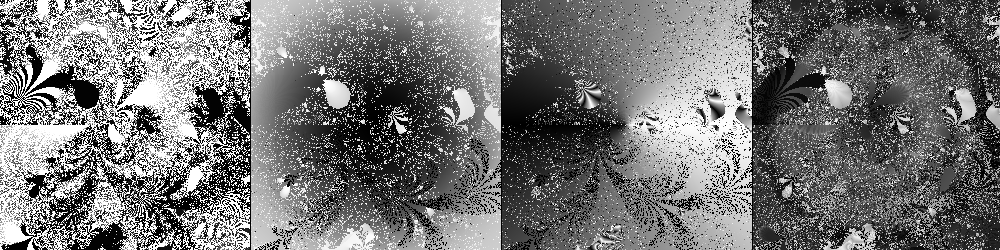

domain & run constraints:
                  center_point: 0j
                          zoom: 0.008547008547008548
                         theta: 0.0
                        it_max: 64
                         max_d: 1403.9999999999998
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpb7hldv09


     starfish_ish_II: 8.201928 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


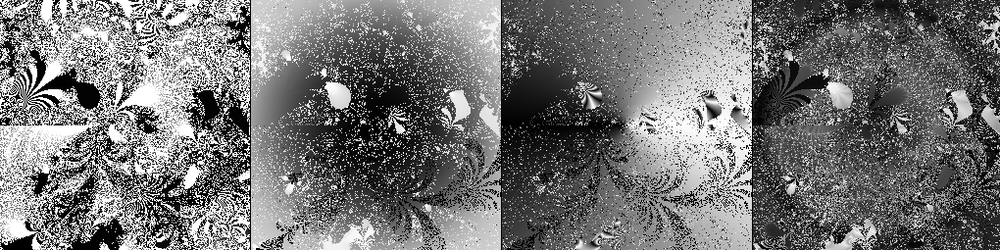

domain & run constraints:
                  center_point: 0j
                          zoom: 0.00819672131147541
                         theta: 0.0
                        it_max: 64
                         max_d: 1464.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpo2812omm


     starfish_ish_II: 8.297608 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


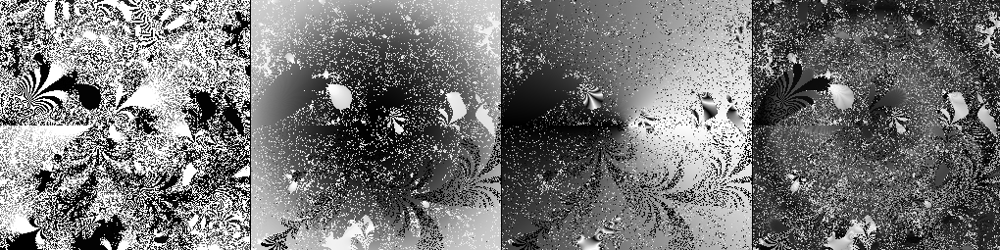

domain & run constraints:
                  center_point: 0j
                          zoom: 0.007874015748031496
                         theta: 0.0
                        it_max: 64
                         max_d: 1524.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp5vj_hjbl


     starfish_ish_II: 8.375865 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


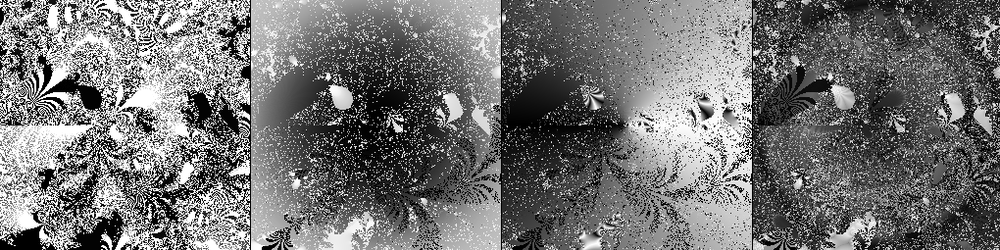

domain & run constraints:
                  center_point: 0j
                          zoom: 0.007575757575757576
                         theta: 0.0
                        it_max: 64
                         max_d: 1584.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpaycf_37n


     starfish_ish_II: 8.236124 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


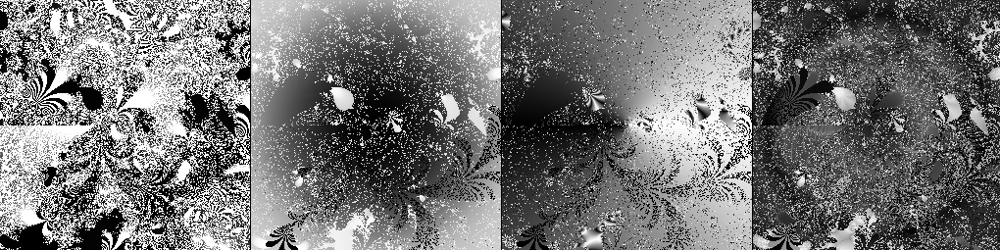

domain & run constraints:
                  center_point: 0j
                          zoom: 0.0072992700729927005
                         theta: 0.0
                        it_max: 64
                         max_d: 1644.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmponlwes24


     starfish_ish_II: 8.011223 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


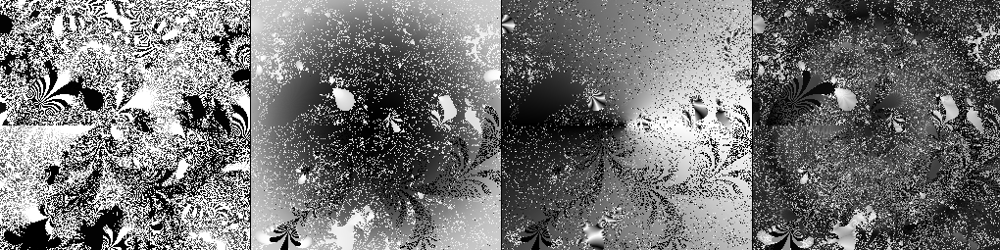

domain & run constraints:
                  center_point: 0j
                          zoom: 0.007042253521126761
                         theta: 0.0
                        it_max: 64
                         max_d: 1704.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpwfgqjkn7


     starfish_ish_II: 8.200060 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


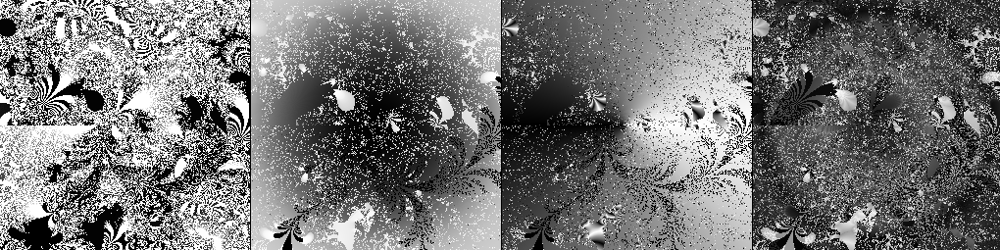

domain & run constraints:
                  center_point: 0j
                          zoom: 0.006802721088435374
                         theta: 0.0
                        it_max: 64
                         max_d: 1764.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmphu_spt9e


     starfish_ish_II: 8.278713 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


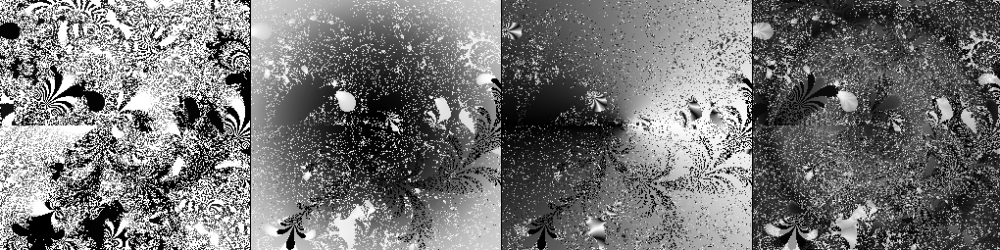

domain & run constraints:
                  center_point: 0j
                          zoom: 0.006578947368421052
                         theta: 0.0
                        it_max: 64
                         max_d: 1824.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp_yhsxezk


     starfish_ish_II: 8.384562 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


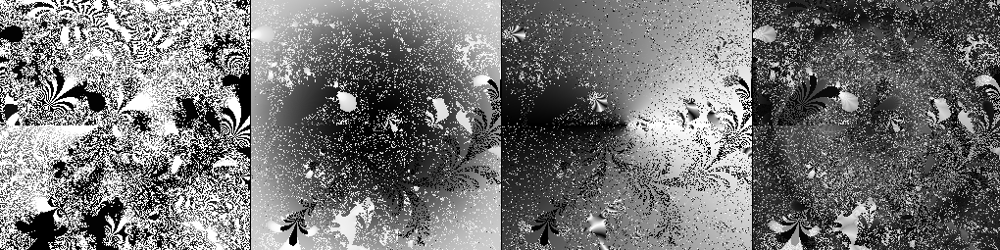

domain & run constraints:
                  center_point: 0j
                          zoom: 0.006369426751592357
                         theta: 0.0
                        it_max: 64
                         max_d: 1884.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpwdrttwvz


     starfish_ish_II: 8.093103 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


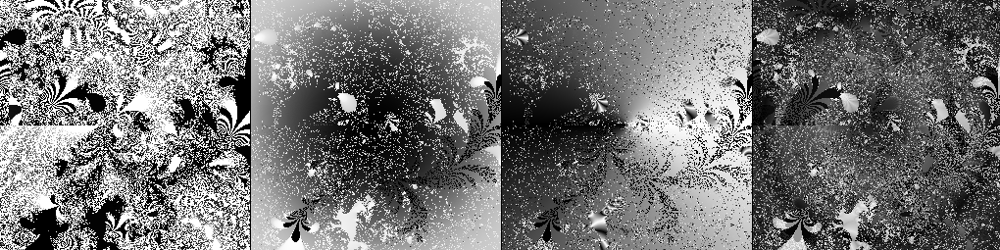

domain & run constraints:
                  center_point: 0j
                          zoom: 0.006172839506172839
                         theta: 0.0
                        it_max: 64
                         max_d: 1944.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpsgxdpyp5


     starfish_ish_II: 8.004124 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


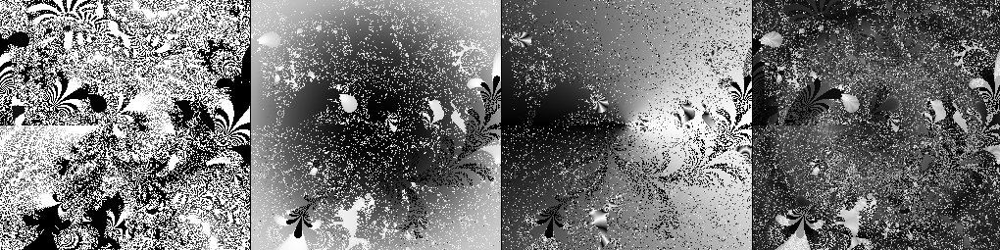

domain & run constraints:
                  center_point: 0j
                          zoom: 0.005988023952095809
                         theta: 0.0
                        it_max: 64
                         max_d: 2003.9999999999998
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpq3ms9glu


     starfish_ish_II: 8.092537 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


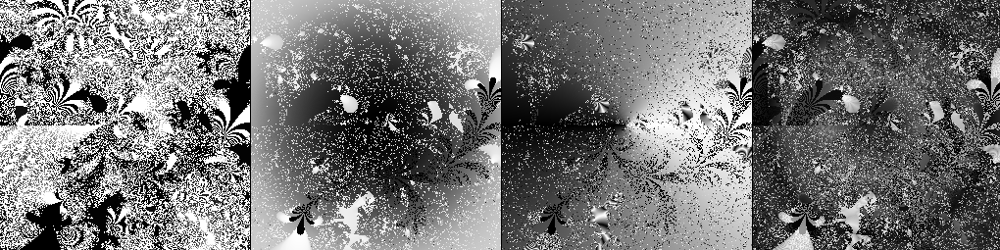

domain & run constraints:
                  center_point: 0j
                          zoom: 0.005813953488372093
                         theta: 0.0
                        it_max: 64
                         max_d: 2064.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpkpo0d_lc


     starfish_ish_II: 8.094601 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


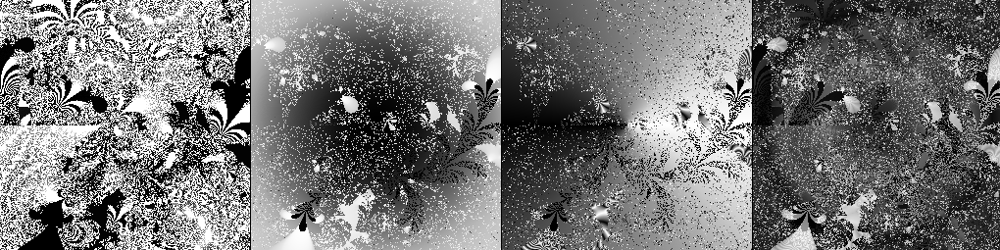

domain & run constraints:
                  center_point: 0j
                          zoom: 0.005649717514124294
                         theta: 0.0
                        it_max: 64
                         max_d: 2124.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpfch443aq


     starfish_ish_II: 8.102906 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


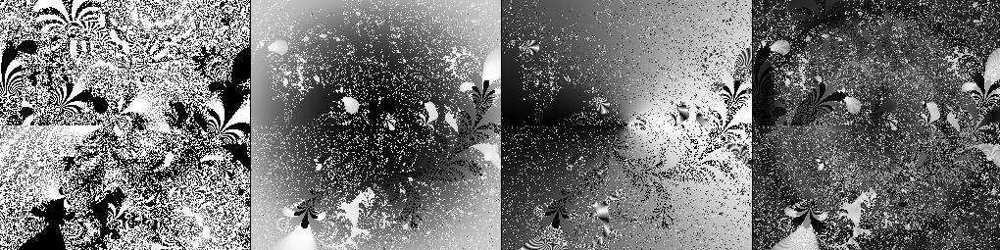

domain & run constraints:
                  center_point: 0j
                          zoom: 0.005494505494505495
                         theta: 0.0
                        it_max: 64
                         max_d: 2184.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpyuk59dmr


     starfish_ish_II: 8.196477 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


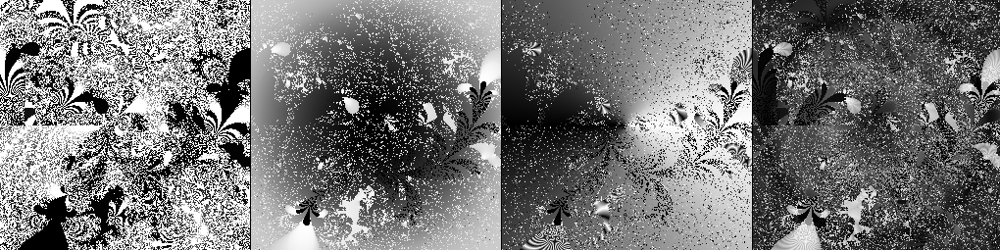

domain & run constraints:
                  center_point: 0j
                          zoom: 0.0053475935828877
                         theta: 0.0
                        it_max: 64
                         max_d: 2244.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpgr1ftvrb


     starfish_ish_II: 8.194866 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


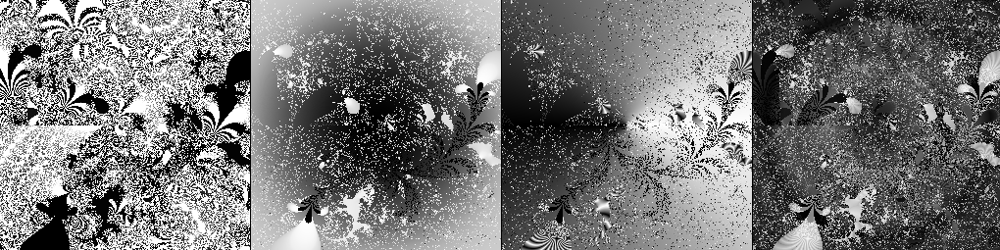

domain & run constraints:
                  center_point: 0j
                          zoom: 0.005208333333333333
                         theta: 0.0
                        it_max: 64
                         max_d: 2304.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpw9h163ms


     starfish_ish_II: 8.318240 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


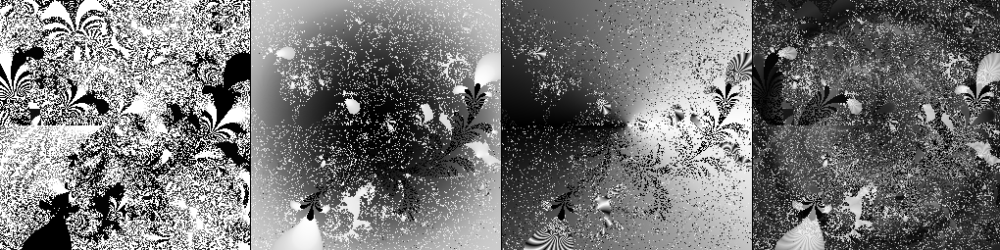

domain & run constraints:
                  center_point: 0j
                          zoom: 0.005076142131979695
                         theta: 0.0
                        it_max: 64
                         max_d: 2364.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp0u9neuza


     starfish_ish_II: 8.290368 seconds
          parameters: (-0.05144829323+0.304348945637j)

             ET                            Zd                            Zr                           All


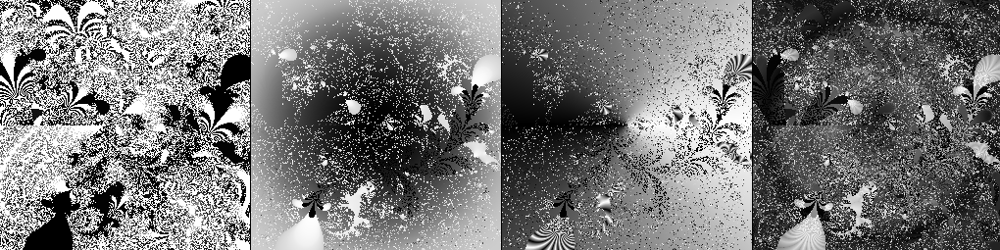

In [13]:
"""
                    starfish_ish_II exploration
"""
# scale dist == multiplier of domain diagonal to get escape distance
scale_dist = 12

domain_dict = get_test_domain_dict()
fcn_number = 13 # starfish_ish_II

fcn_name, fcn = name_functionhandle_dict[fcn_number][0], name_functionhandle_dict[fcn_number][1]
p = p = fcn(0.0, None)
list_tuple = [(fcn, (p))]

z1 = [k for k in range(3, 0, -0.5)]
z2 = [1/k for k in range(2, 50, 5)]
zoom_fact_list = z1 + z2

n_to_go = len(zoom_fact_list)
print(n_to_go, ' total to do')
for zoom_fact in zoom_fact_list:
    domain_dict['zoom'] = zoom_fact
    domain_dict['max_d'] = scale_dist / domain_dict['zoom']
    print('\t\t%i to go'%(n_to_go))
    n_to_go -= 1
    display_calc_result(list_tuple, domain_dict)


domain & run constraints:
                  center_point: 0j
                          zoom: 1.0
                         theta: 0.0
                        it_max: 64
                         max_d: 12.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpyxgxqblg


         thunderHead: 1.813070 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


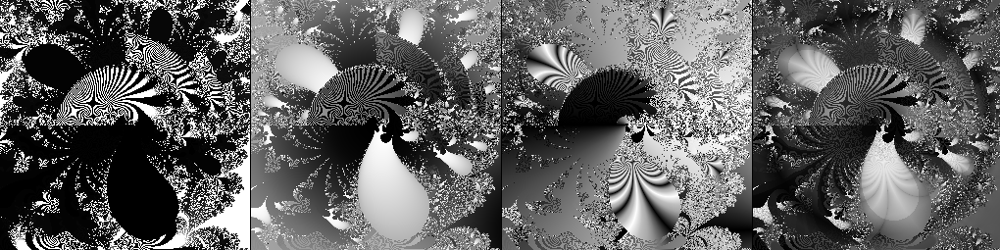

domain & run constraints:
                  center_point: 0j
                          zoom: 0.5
                         theta: 0.0
                        it_max: 64
                         max_d: 24.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmprp6b63_z


         thunderHead: 2.412454 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


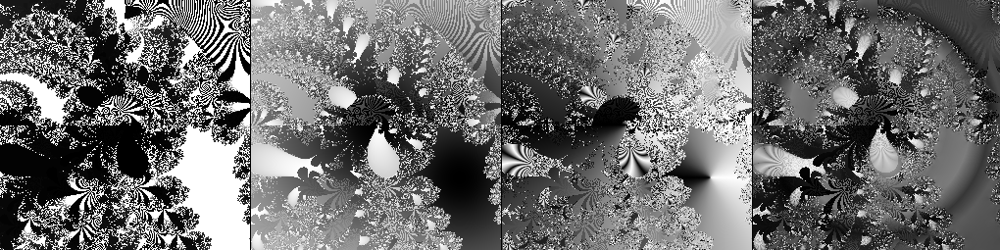

domain & run constraints:
                  center_point: 0j
                          zoom: 0.1111111111111111
                         theta: 0.0
                        it_max: 64
                         max_d: 108.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpn59dog72


         thunderHead: 2.716457 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


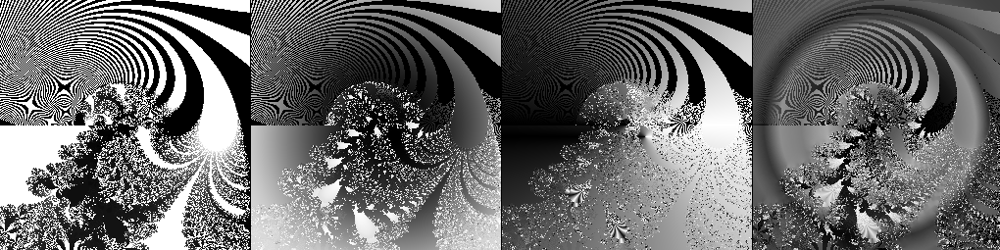

domain & run constraints:
                  center_point: 0j
                          zoom: 0.015625
                         theta: 0.0
                        it_max: 64
                         max_d: 768.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpr3fbo58t


         thunderHead: 1.710783 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


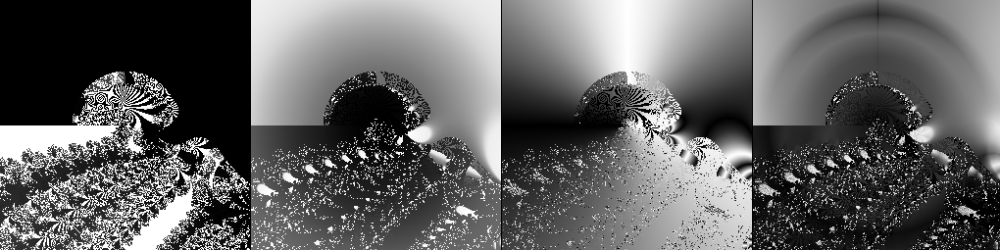

domain & run constraints:
                  center_point: 0j
                          zoom: 0.0016
                         theta: 0.0
                        it_max: 64
                         max_d: 7500.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpoq7yrmmk


         thunderHead: 2.770345 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


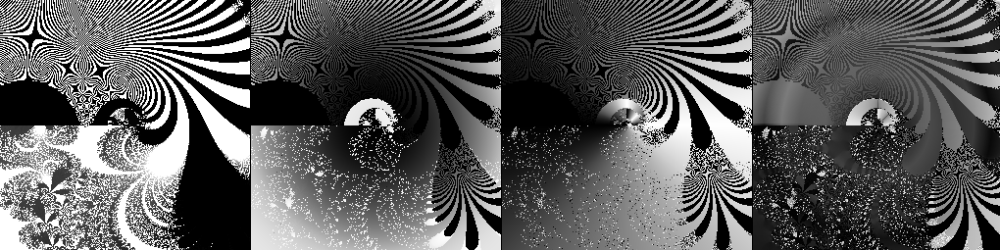

domain & run constraints:
                  center_point: 0j
                          zoom: 0.0001286008230452675
                         theta: 0.0
                        it_max: 64
                         max_d: 93311.99999999999
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpfk_nb9u2


         thunderHead: 2.762911 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


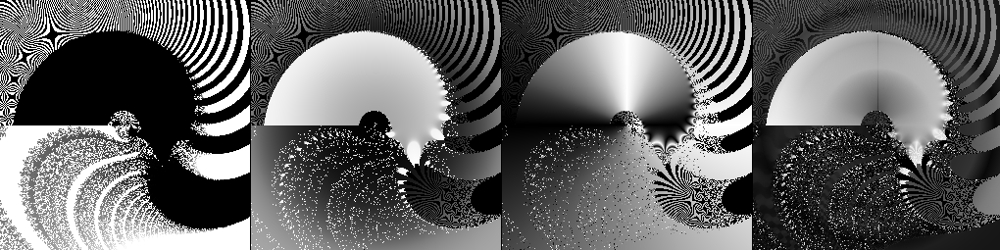

domain & run constraints:
                  center_point: 0j
                          zoom: 8.499859752314087e-06
                         theta: 0.0
                        it_max: 64
                         max_d: 1411788.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp941ahrsy


         thunderHead: 1.627942 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


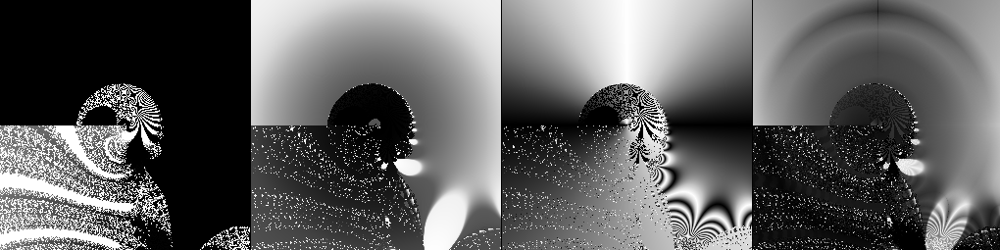

domain & run constraints:
                  center_point: 0j
                          zoom: 4.76837158203125e-07
                         theta: 0.0
                        it_max: 64
                         max_d: 25165824.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpjuzcjg_i


         thunderHead: 1.841625 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


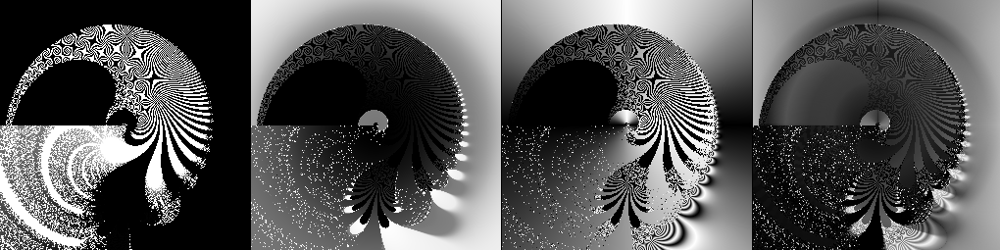

domain & run constraints:
                  center_point: 0j
                          zoom: 2.3230573125418773e-08
                         theta: 0.0
                        it_max: 64
                         max_d: 516560652.00000006
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpp6cdefgs


         thunderHead: 2.416007 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


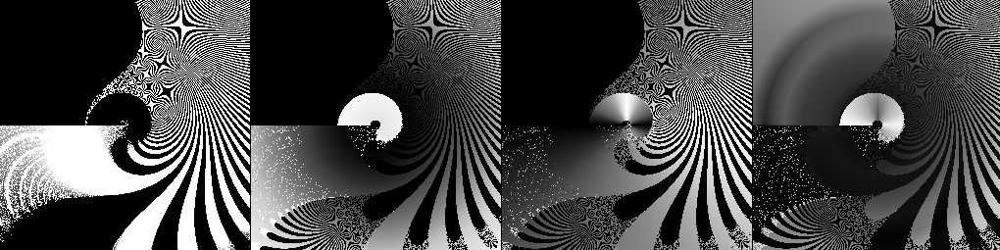

domain & run constraints:
                  center_point: 0j
                          zoom: 1e-09
                         theta: 0.0
                        it_max: 64
                         max_d: 12000000000.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmptdm5wuaa


         thunderHead: 2.349461 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


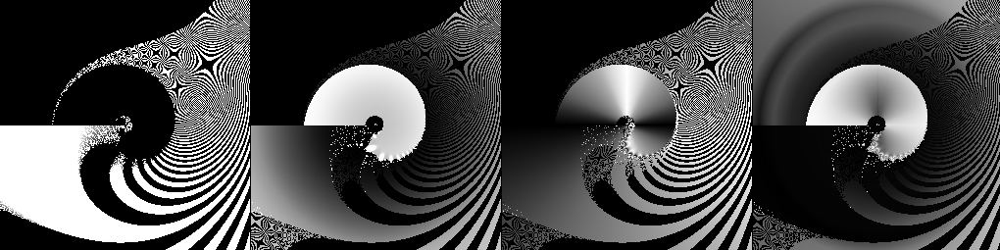

domain & run constraints:
                  center_point: 0j
                          zoom: 3.8554328942953176e-11
                         theta: 0.0
                        it_max: 64
                         max_d: 311249095212.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmph9qfas8h


         thunderHead: 1.832380 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


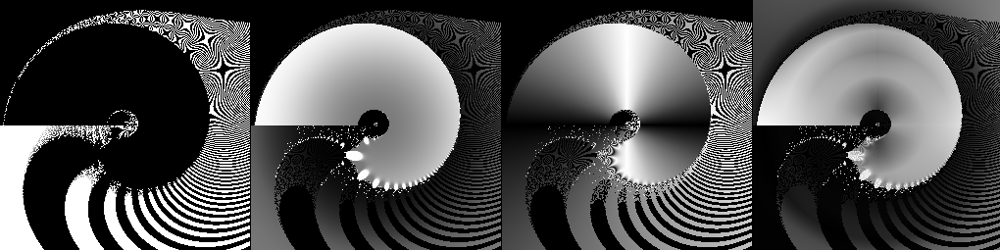

domain & run constraints:
                  center_point: 0j
                          zoom: 1.345879857415381e-12
                         theta: 0.0
                        it_max: 64
                         max_d: 8916100448256.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp8kq3wm1g


         thunderHead: 1.224531 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


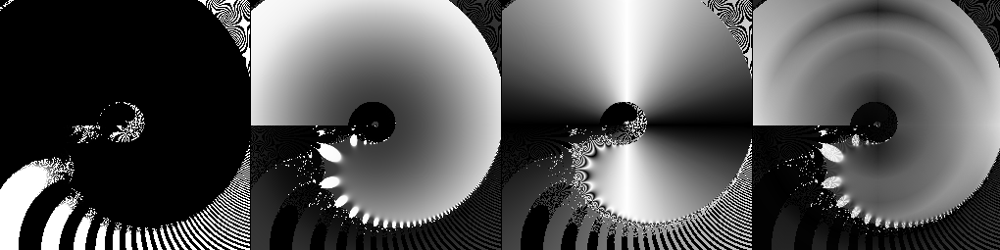

domain & run constraints:
                  center_point: 0j
                          zoom: 4.292198241799155e-14
                         theta: 0.0
                        it_max: 64
                         max_d: 279577021469772.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpllxojrsf


         thunderHead: 0.915101 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


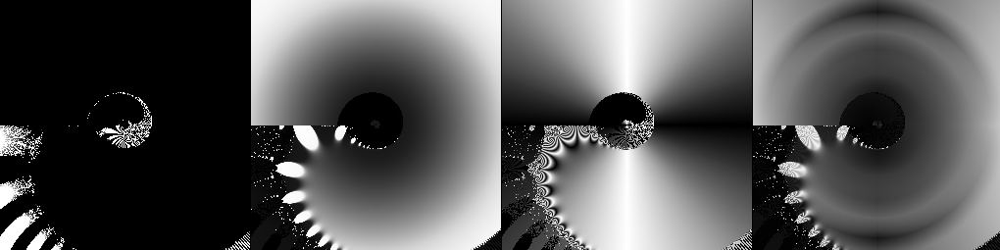

domain & run constraints:
                  center_point: 0j
                          zoom: 1.2598984341693793e-15
                         theta: 0.0
                        it_max: 64
                         max_d: 9524577279049728.0
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpvneddsf7


         thunderHead: 0.572859 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


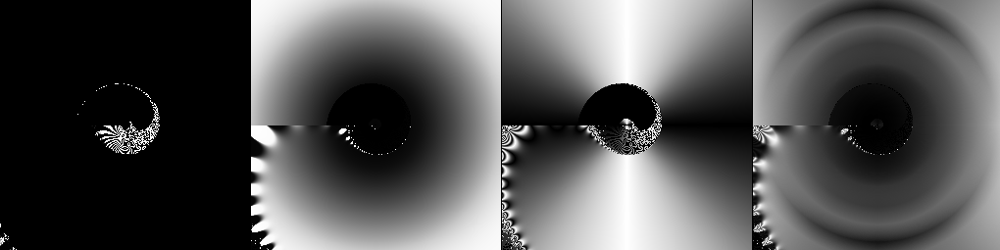

domain & run constraints:
                  center_point: 0j
                          zoom: 3.425487390781751e-17
                         theta: 0.0
                        it_max: 64
                         max_d: 3.503151123046875e+17
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp_6h0zn7l


         thunderHead: 0.657627 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


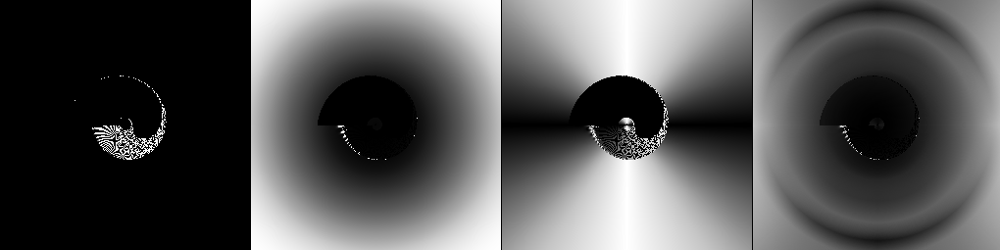

domain & run constraints:
                  center_point: 0j
                          zoom: 8.673617379884035e-19
                         theta: 0.0
                        it_max: 64
                         max_d: 1.3835058055282164e+19
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpev6v7mbg


         thunderHead: 0.660445 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


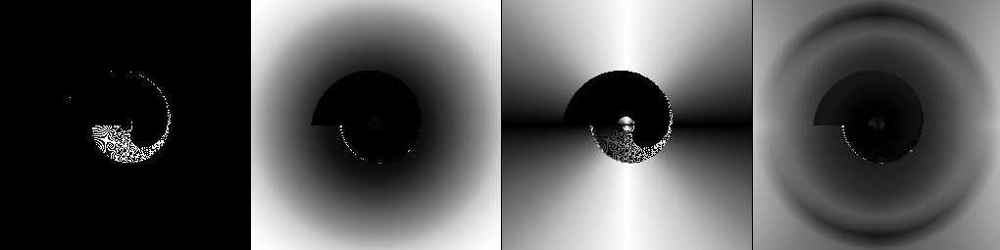

domain & run constraints:
                  center_point: 0j
                          zoom: 2.0550257021140745e-20
                         theta: 0.0
                        it_max: 64
                         max_d: 5.839343025080024e+20
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpju_d7qx3


         thunderHead: 0.542670 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


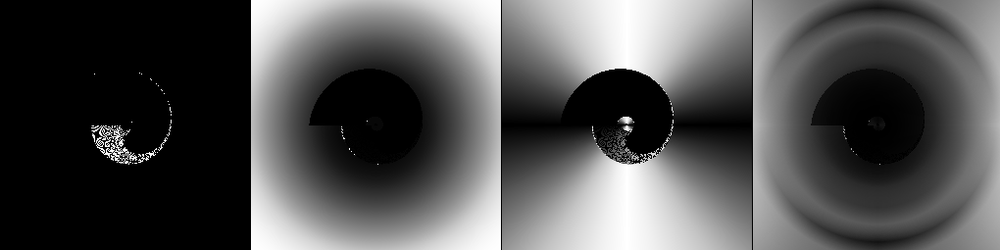

domain & run constraints:
                  center_point: 0j
                          zoom: 4.574750499601822e-22
                         theta: 0.0
                        it_max: 64
                         max_d: 2.6230938716864357e+22
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpe7p0za9r


         thunderHead: 0.540366 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


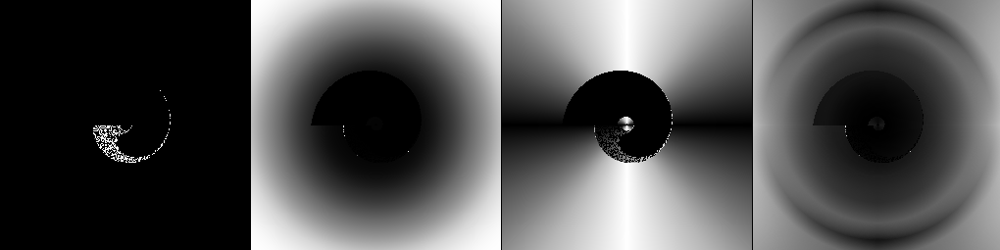

domain & run constraints:
                  center_point: 0j
                          zoom: 9.603624764665309e-24
                         theta: 0.0
                        it_max: 64
                         max_d: 1.2495282035749348e+24
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmpqw4_btcr


         thunderHead: 0.576786 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


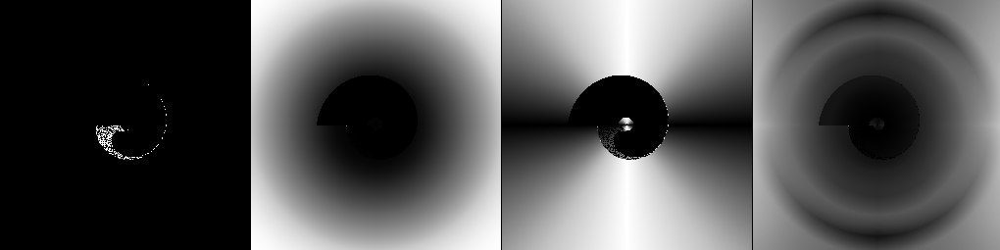

domain & run constraints:
                  center_point: 0j
                          zoom: 1.9073486328125e-25
                         theta: 0.0
                        it_max: 64
                         max_d: 6.291456e+25
                        n_rows: 255
                        n_cols: 255
                       tmp_dir: /var/folders/7y/bf1fndjd1w3_qjbnrmb3n_4m0000gn/T/tmp29k7tke4


         thunderHead: 0.550293 seconds
          parameters: [3.83796971, (-0.09564841+0.83234946j)]

             ET                            Zd                            Zr                           All


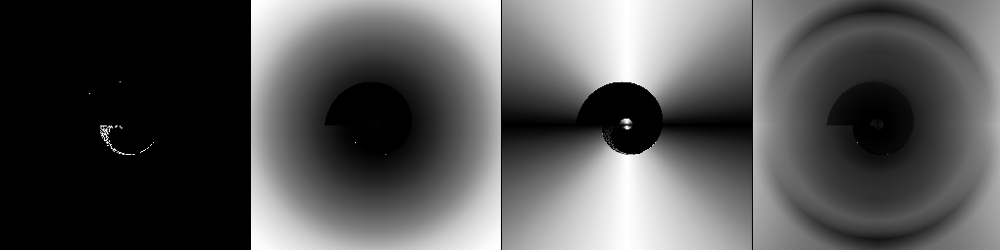

In [2]:
"""
                    thunderhead exploration
"""
# scale dist == multiplier of domain diagonal to get escape distance
scale_dist = 12

domain_dict = get_test_domain_dict()
fcn_number = 14 # thunderhead

fcn_name, fcn = name_functionhandle_dict[fcn_number][0], name_functionhandle_dict[fcn_number][1]
p = p = fcn(0.0, None)
list_tuple = [(fcn, (p))]

# zoom_fact_list = [1/k for k in range(1, 200, 10)]
zoom_fact_list = [1/((1+k)**k) for k in range(0, 20)]
for zoom_fact in zoom_fact_list:
    domain_dict['zoom'] = zoom_fact
    domain_dict['max_d'] = scale_dist / domain_dict['zoom']
    display_calc_result(list_tuple, domain_dict)
